In [30]:
from skimage import io, color, transform, exposure, filters, util
import os
import numpy as np
import matplotlib.pyplot as plt
import warnings
import cv2
from sklearn.preprocessing import maxabs_scale
warnings.filterwarnings('ignore')

%matplotlib inline

# IO functions

In [31]:
def load_images(dir, gray=False):
    images = []
    for path in dir:
        img_tmp = {}
        for i, file in enumerate(os.listdir(path)):
            img = io.imread(os.path.join(path,file))
            img = transform.resize(img, (150, 150))
            if gray:
                img = color.rgb2gray(img)
            if img is not None:
                img_tmp[f'{i}.jpg'] = img
        images.append(img_tmp)
    return images

In [32]:
def save_images(dir, images):
    try:
        for i, path in enumerate(dir):
            for name, image in images[i].items():
                io.imsave(os.path.join(path,name), image)
    except Exception as err:
        print(err)

In [126]:
def scale(img):
    return util.img_as_ubyte(img)

# Testando implementação


In [33]:
base = 'C:/Users/brunosm/Documents/disciplinas/VISAOC/atividades/atv1/datasets/original/'

In [124]:
images = load_images([base+'n/', base+'p/'])

In [35]:
#laplace = base.replace('original','laplace')
#save_images([laplace+'n/', laplace+'p/'], images)

# Conjunto de teste

In [140]:
test1 = [images[0][f'{i}.jpg'] for i in range(4)]
#del images

# Roteiro 1

## Roteiro 1.a - equalização de histograma

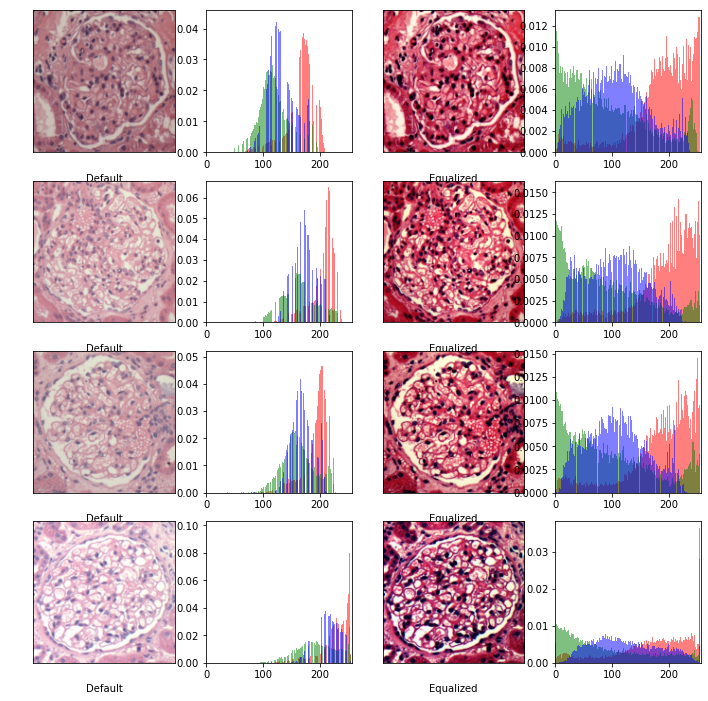

In [187]:
fig, axes = plt.subplots(4,4,figsize=(12,12))
for i, img in enumerate(test1):
    x = img.copy()
    axes[i][0].imshow(x)
    axes[i][0].set_xlabel('Default')
    axes[i][0].tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)

    y = exposure.equalize_hist(x)
    axes[i][2].imshow(y)
    axes[i][2].set_xlabel('Equalized')
    axes[i][2].tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)

    _ = axes[i][1].hist(scale(x)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True)
    _ = axes[i][1].hist(scale(x)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True)
    _ = axes[i][1].hist(scale(x)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True)
    axes[i][1].set_xlim(0,256)
    #axes[i][1].set_ylim(0,0.1)

    _ = axes[i][3].hist(scale(y)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True)
    _ = axes[i][3].hist(scale(y)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True)
    _ = axes[i][3].hist(scale(y)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True)
    axes[i][3].set_xlim(0,256)
    #axes[i][3].set_ylim(0,0.1)


## Roteiro 1.b - correção de gamma

### correção de gamma 1

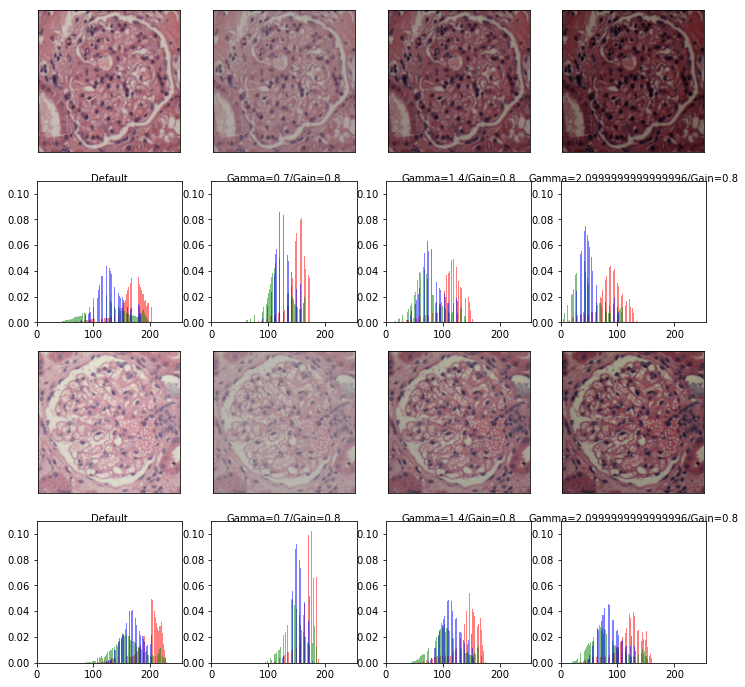

In [190]:
fig, axes = plt.subplots(4,4,figsize=(12,12))
for i, img in enumerate(test1):
    for j in range(4):
        x = test1[i-(i%2)].copy()
        y = exposure.adjust_gamma(x,0.7*(j),0.8)
        if not i%2 and not j:
            axes[i][j].imshow(x)
            axes[i][j].set_xlabel('Default')
            axes[i][j].tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
        if not j and i%2:
            _ = axes[i][j].hist(scale(x)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True)
            _ = axes[i][j].hist(scale(x)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True)
            _ = axes[i][j].hist(scale(x)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True)
            axes[i][j].set_xlim(0,256)
            axes[i][j].set_ylim(0,0.11)
        if j and not i%2:
            axes[i][j].imshow(y)
            axes[i][j].set_xlabel(f'Gamma={0.7*(j)}/Gain=0.8')
            axes[i][j].tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
        if j and i%2: 
            _ = axes[i][j].hist(scale(y)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True)
            _ = axes[i][j].hist(scale(y)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True)
            _ = axes[i][j].hist(scale(y)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True)
            axes[i][j].set_xlim(0,256)
            axes[i][j].set_ylim(0,0.11)

### correção de gamma 2

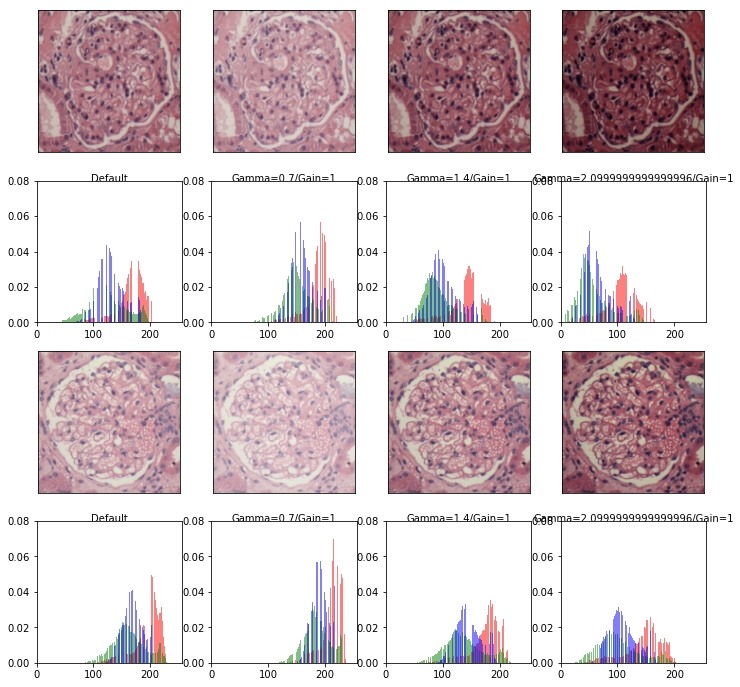

In [191]:
fig, axes = plt.subplots(4,4, figsize=(12,12))
for i, img in enumerate(test1):
    for j in range(4):
        x = test1[i-(i%2)].copy()
        y = exposure.adjust_gamma(x,0.7*(j),1)
        if not i%2 and not j:
            axes[i][j].imshow(x)
            axes[i][j].set_xlabel('Default')
            axes[i][j].tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
        if not j and i%2:
            _ = axes[i][j].hist(scale(x)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True)
            _ = axes[i][j].hist(scale(x)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True)
            _ = axes[i][j].hist(scale(x)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True)
            axes[i][j].set_xlim(0,256)
            axes[i][j].set_ylim(0,0.08)
        if j and not i%2:
            axes[i][j].imshow(y)
            axes[i][j].set_xlabel(f'Gamma={0.7*(j)}/Gain=1')
            axes[i][j].tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
        if j and i%2: 
            _ = axes[i][j].hist(scale(y)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True)
            _ = axes[i][j].hist(scale(y)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True)
            _ = axes[i][j].hist(scale(y)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True)
            axes[i][j].set_xlim(0,256)
            axes[i][j].set_ylim(0,0.08)

### correção de gamma 3

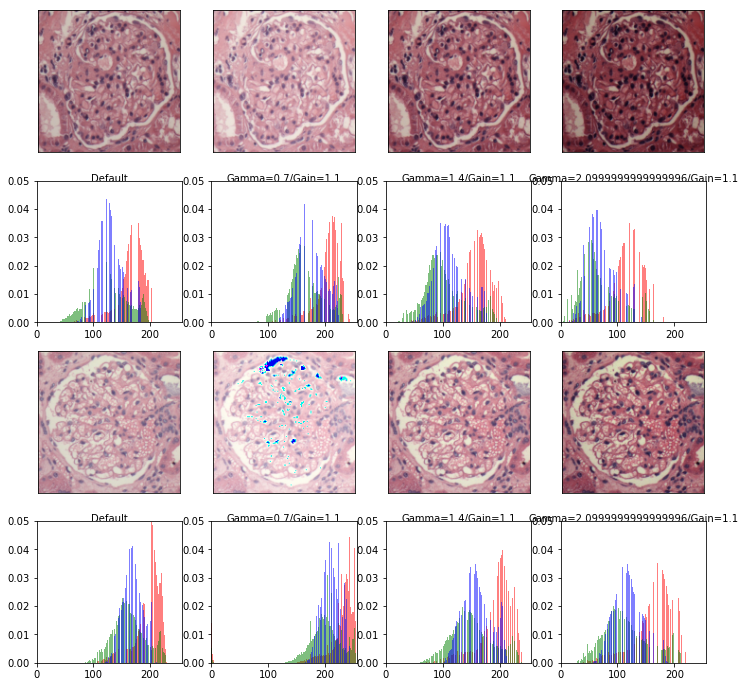

In [194]:
fig, axes = plt.subplots(4,4,figsize=(12,12))
for i, img in enumerate(test1):
    for j in range(4):
        x = test1[i-(i%2)].copy()
        x = scale(x)
        y = exposure.adjust_gamma(x,0.7*(j),1.1)
        if not i%2 and not j:
            axes[i][j].imshow(x)
            axes[i][j].set_xlabel('Default')
            axes[i][j].tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
        if not j and i%2:
            _ = axes[i][j].hist(scale(x)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True)
            _ = axes[i][j].hist(scale(x)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True)
            _ = axes[i][j].hist(scale(x)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True)
            axes[i][j].set_xlim(0,256)
            axes[i][j].set_ylim(0,0.05)
        if j and not i%2:
            axes[i][j].imshow(y)
            axes[i][j].set_xlabel(f'Gamma={0.7*(j)}/Gain=1.1')
            axes[i][j].tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
        if j and i%2: 
            _ = axes[i][j].hist(scale(y)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True)
            _ = axes[i][j].hist(scale(y)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True)
            _ = axes[i][j].hist(scale(y)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True)
            axes[i][j].set_xlim(0,256)
            axes[i][j].set_ylim(0,0.05)

## Roteiro 1.c - filtro gaussiano

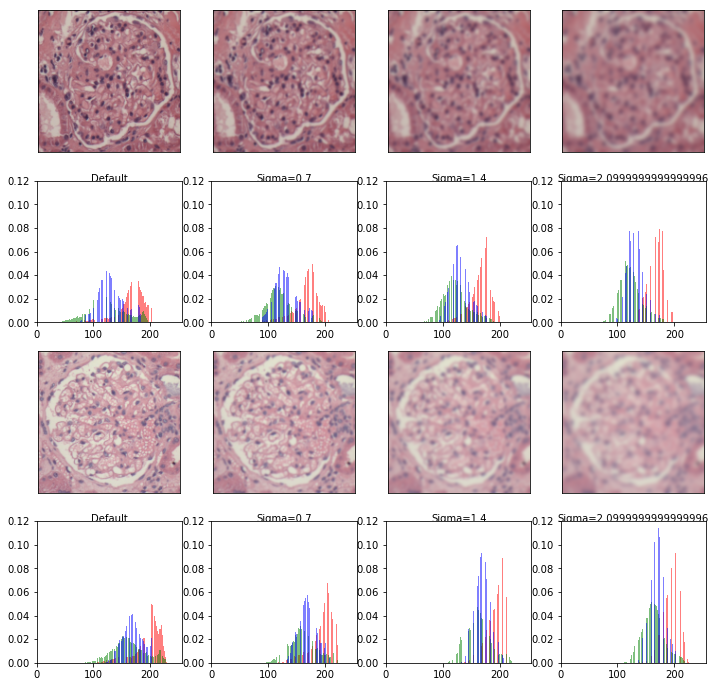

In [195]:
fig, axes = plt.subplots(4,4, figsize=(12,12))
for i, img in enumerate(test1):
    for j in range(4):
        x = test1[i-(i%2)].copy()
        y = filters.gaussian(x, 0.7*j)
        if not i%2 and not j:
            axes[i][j].imshow(x)
            axes[i][j].set_xlabel('Default')
            axes[i][j].tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
        if not j and i%2:
            _ = axes[i][j].hist(scale(x)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True)
            _ = axes[i][j].hist(scale(x)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True)
            _ = axes[i][j].hist(scale(x)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True)
            axes[i][j].set_xlim(0,256)
            axes[i][j].set_ylim(0,0.12)
        if j and not i%2:
            axes[i][j].imshow(y)
            axes[i][j].set_xlabel(f'Sigma={0.7*j}')
            axes[i][j].tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
        if j and i%2: 
            _ = axes[i][j].hist(scale(y)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True)
            _ = axes[i][j].hist(scale(y)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True)
            _ = axes[i][j].hist(scale(y)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True)
            axes[i][j].set_xlim(0,256)
            axes[i][j].set_ylim(0,0.12)

## Roteiro 1.d - filtro de laplace

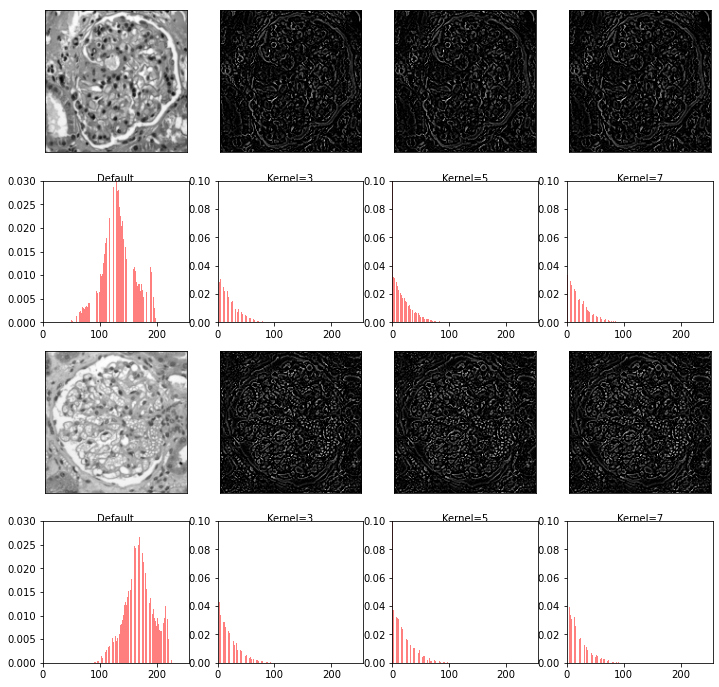

In [197]:
fig, axes = plt.subplots(4,4, figsize=(12,12))
kernel = [3, 5, 7]
for i, img in enumerate(test1):
    for j in range(4):
        x = test1[i-(i%2)].copy()
        x = color.rgb2gray(scale(x))
        y = scale(x)
        if j:
            y = filters.laplace(y,ksize=kernel[j-1])
            y = scale(y)
        if not i%2 and not j:
            axes[i][j].imshow(x, cmap='gray')
            axes[i][j].set_xlabel('Default')
            axes[i][j].tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
        if not j and i%2:
            _ = axes[i][j].hist(scale(x).ravel(), bins = 256, color = 'red', alpha = 0.5, density=True)
            axes[i][j].set_xlim(0,256)
            axes[i][j].set_ylim(0,0.03)
        if j and not i%2:
            axes[i][j].imshow(y, cmap='gray')
            axes[i][j].set_xlabel(f'Kernel={kernel[j-1]}')
            axes[i][j].tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
        if j and i%2: 
            _ = axes[i][j].hist(scale(y).ravel(), bins = 256, color = 'red', alpha = 0.5, density=True)
            axes[i][j].set_xlim(0,256)
            axes[i][j].set_ylim(0,0.1)

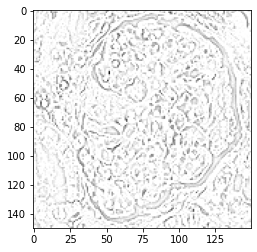

In [183]:
x = test1[0].copy()
x = color.rgb2gray(scale(x))
y = scale(x)
y = filters.laplace(y)
y = scale(y)
y = ~y
plt.imshow(y, cmap='gray')

# Roteiro 2

In [44]:
def light_intensity(img, scalar):
    img = scale(img)
    for i in range(3):
        img[:,:,i] *= scalar
    return img

In [45]:
def light_shift(img, scalar):
    img = scale(img)
    for i in range(3):
        img[:,:,i] += scalar
    return img

In [46]:
def light_shift_and_intensity(img, scalar1, scalar2):
    img = scale(img)
    img = light_intensity(img, scalar1)
    img = light_shift(img, scalar2)
    return img

In [48]:
def o1_o2(img):
    img = scale(img)
    o1 = (img[:,:,0] - img[:,:,1])/np.sqrt(2)
    o2 = (img[:,:,0] + img[:,:,1] - 2*img[:,:,2])/np.sqrt(6)
    
    o1 = maxabs_scale(o1)
    o2 = maxabs_scale(o2)
    o1 = scale(o1)
    o2 = scale(o2)
    return o1, o2

In [49]:
def transformed_color(img):
    img = scale(img)
    for i in range(3):
        img[:,:,i] = (img[:,:,i]-np.mean(img[:,:,i])*img[:,:,i])/(np.std(img[:,:,i])*img[:,:,i])
    img = scale(img)
    return img

In [50]:
#img[:,:,0].shape = (img[:,:,i]-np.mean(img[:,:,i])*img[:,:,i])/(np.std(img[:,:,i])*img[:,:,i])

In [51]:
test = [images[0][f'{np.random.randint(0,100)}.jpg'] for i in range(4)]
#del images

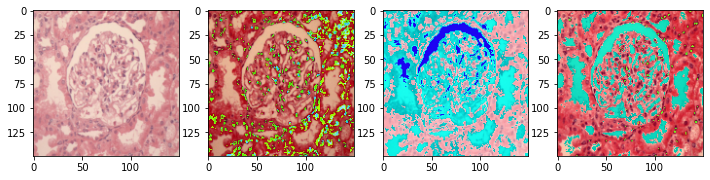

In [52]:
fig, axes = plt.subplots(1,4, figsize=(12,12))
axes[0].imshow(test[0])
axes[1].imshow(light_intensity(test[0].copy(),2))
axes[2].imshow(light_shift(test[0].copy(),40))
axes[3].imshow(light_shift_and_intensity(test[0].copy(),2,50))


In [54]:
o1, o2 = o1_o2(test[0].copy())
#print(o1, o2)

## Roteiro 2.a - RGB Histogram

Text(0.5, 1.0, 'Light Intensity change and shift')

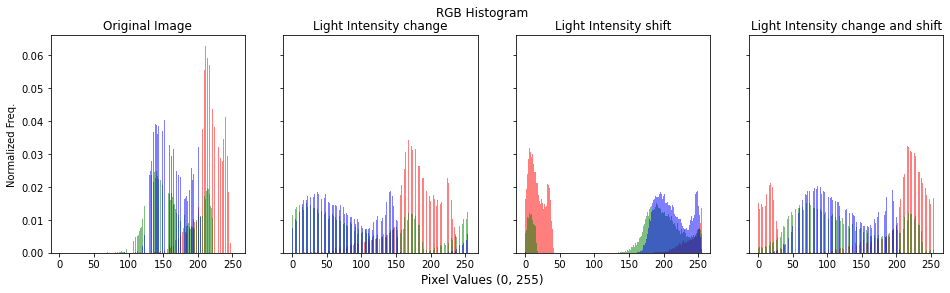

In [198]:
fig, axes = plt.subplots(1,4, sharey=True, sharex=True, figsize=(16,4))
fig.supxlabel('Pixel Values (0, 255)')
fig.suptitle('RGB Histogram')

sc = scale(test[0].copy())
_ = axes[0].hist(sc[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True)
_ = axes[0].hist(sc[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True)
_ = axes[0].hist(sc[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True)
axes[0].set_title('Original Image')
axes[0].set_ylabel('Normalized Freq.')

li = light_intensity(test[0].copy(),2)
_ = axes[1].hist(li[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True)
_ = axes[1].hist(li[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True)
_ = axes[1].hist(li[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True)
axes[1].set_title('Light Intensity change')

ls = light_shift(test[0].copy(),50)
_ = axes[2].hist(ls[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True)
_ = axes[2].hist(ls[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True)
_ = axes[2].hist(ls[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True)
axes[2].set_title('Light Intensity shift')

lsi = light_shift_and_intensity(test[0].copy(),2,50)
_ = axes[3].hist(lsi[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True)
_ = axes[3].hist(lsi[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True)
_ = axes[3].hist(lsi[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True)
axes[3].set_title('Light Intensity change and shift')

## Roteiro 2.b - O1, O2

Text(0.5, 1.0, 'Light Intensity change and shift')

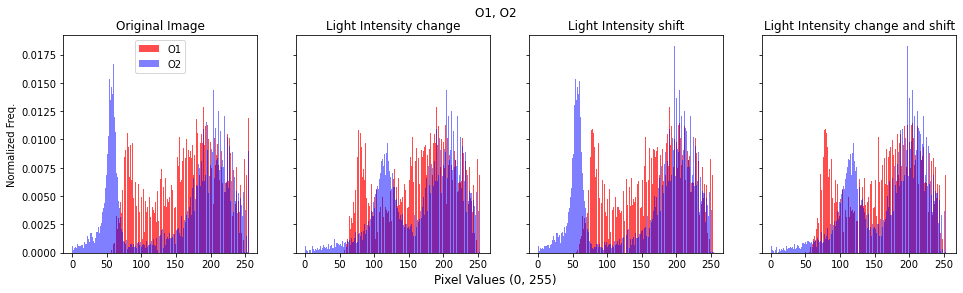

In [200]:
fig, axes = plt.subplots(1,4, sharey=True, sharex=True, figsize=(16,4))
fig.supxlabel('Pixel Values (0, 255)')
fig.suptitle('O1, O2')


o1, o2 = o1_o2(test[0].copy())
_ = axes[0].hist(o1.flatten(), bins = 256, color = 'red', alpha = 0.7, density=True, label='O1')
_ = axes[0].hist(o2.flatten(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='O2')
axes[0].set_title('Original Image')
axes[0].set_ylabel('Normalized Freq.')
axes[0].legend()

li = light_intensity(test[0].copy(),2)
lio1, lio2 = o1_o2(li)
_ = axes[1].hist(lio1.flatten(), bins = 256, color = 'red', alpha = 0.7, density=True, label='O1')
_ = axes[1].hist(lio2.flatten(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='O2')
axes[1].set_title('Light Intensity change')

ls = light_shift(test[0].copy(),50)
lso1, lso2 = o1_o2(ls)
_ = axes[2].hist(lso1.flatten(), bins = 256, color = 'red', alpha = 0.7, density=True, label='O1')
_ = axes[2].hist(lso2.flatten(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='O2')
axes[2].set_title('Light Intensity shift')

lsi = light_shift_and_intensity(test[0].copy(),2,50)
lsio1, lsio2 = o1_o2(li)
_ = axes[3].hist(lsio1.flatten(), bins = 256, color = 'red', alpha = 0.7, density=True, label='O1')
_ = axes[3].hist(lsio2.flatten(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='O2')
axes[3].set_title('Light Intensity change and shift')


## Roteiro 2.c - Transformed Color

In [58]:
"""
fig, axes = plt.subplots(1,4, sharey=True, figsize=(16,4))
fig.supxlabel('Pixel Values (0, 255)')
fig.suptitle('Transformed Color')

img = transformed_color(test[0].copy())
sc = scale(img)
_ = axes[0].hist(sc[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True)
_ = axes[0].hist(sc[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True)
_ = axes[0].hist(sc[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True)
axes[0].set_title('Original Image')
axes[0].set_ylabel('Normalized Freq.')

li = light_intensity(img,2)
_ = axes[1].hist(li[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True)
_ = axes[1].hist(li[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True)
_ = axes[1].hist(li[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True)
axes[1].set_title('Light Intensity change')

ls = light_shift(img,50)
_ = axes[2].hist(ls[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True)
_ = axes[2].hist(ls[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True)
_ = axes[2].hist(ls[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True)
axes[2].set_title('Light Intensity shift')

lsi = light_shift_and_intensity(img,2,50)
_ = axes[3].hist(lsi[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True)
_ = axes[3].hist(lsi[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True)
_ = axes[3].hist(lsi[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True)
axes[3].set_title('Light Intensity change and shift')
"""

"\nfig, axes = plt.subplots(1,4, sharey=True, figsize=(16,4))\nfig.supxlabel('Pixel Values (0, 255)')\nfig.suptitle('Transformed Color')\n\nimg = transformed_color(test[0].copy())\nsc = scale(img)\n_ = axes[0].hist(sc[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True)\n_ = axes[0].hist(sc[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True)\n_ = axes[0].hist(sc[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True)\naxes[0].set_title('Original Image')\naxes[0].set_ylabel('Normalized Freq.')\n\nli = light_intensity(img,2)\n_ = axes[1].hist(li[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True)\n_ = axes[1].hist(li[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True)\n_ = axes[1].hist(li[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True)\naxes[1].set_title('Light Intensity change')\n\nls = light_shift(img,50)\n_ = axes[2].hist(ls[:, :, 0].ravel(), bins = 256, color =